# Исследование оттока клиентов

В рамках данного исследования наша задача состоит в анализе оттока клиентов банка «Метанпром». В нашем распоряжении данные о клиентах банка. Наша цель - проанализировать клиентов и выделить сегменты клиентов, которые склонны уходить из банка.

Для выполнения цели составим план работ:

1. Загрузка и предобработка данных  
Загрузим данные и изучим основную информацию о них. Далее мы проведем предобработку данных: переименуем столбцы, изучим данные на наличие пропусков и дубликатов, изменим типы данных при необходимости.  
2. Исследовательский анализ данных  
Изучим распределение различных признаков клиентов (в том числе в разрезе оттока), изучим корреляцию этих признаков и на основе этих признаков составим портрет клиента. 
3. Статистический анализ данных  
На основании проведенного исследовательского анализа данных сформулируем две гипотезы и проверим их при помощи статистических инструментов.  
4. Подведение промежуточных итогов  
Исходя из проведенного анализа данных выделим признаки, влияющие на отток клиентов.  
5. Сегментация  
Используя выделенные признаки проведем сегментацию клиентов, приоритизируем сегменты исходя из того, с какими клиентами нужно провести работу по предотвращению оттока в первую очередь, и сформулируем рекомендации для удержания клиентов из каждого сегмента в зоне риска.  
6. Презентация результатов  
Подготовим презентацию с результатами нашего исследования.

Приступим к исследованию!

## Загрузка и предобработка данных

### Загрузка данных

Для начала импортируем нужные библиотеки.

In [1]:
# работа с предупреждениями
import warnings
# работа с данными
import pandas as pd
import numpy as np
import phik
# работа с графиками
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# работа со статистическими тестами
from scipy import stats as st
import math as mth

Теперь загрузим данные в переменную `data` и изучим основную информацию о них.

In [2]:
try:
    data = pd.read_csv('/Users/macbook/practicum/projects/bank_project/bank_scrooge.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net//datasets/bank_scrooge.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   USERID         10000 non-null  int64  
 1   score          10000 non-null  float64
 2   city           10000 non-null  object 
 3   gender         10000 non-null  object 
 4   age            9974 non-null   float64
 5   equity         10000 non-null  int64  
 6   balance        7705 non-null   float64
 7   products       10000 non-null  int64  
 8   credit_card    10000 non-null  int64  
 9   last_activity  10000 non-null  int64  
 10  EST_SALARY     10000 non-null  float64
 11  churn          10000 non-null  int64  
dtypes: float64(4), int64(6), object(2)
memory usage: 937.6+ KB


In [4]:
data.sample(10)

,USERID,score,city,gender,age,equity,balance,products,credit_card,last_activity,EST_SALARY,churn
3796,219661,953.0,Ярославль,М,50.0,3,1693104.14,2,0,0,290905.74,0
8793,207144,815.0,Ярославль,Ж,62.0,2,455969.27,3,0,0,119280.34,0
4683,127124,852.0,Ярославль,Ж,66.0,3,597326.55,2,1,1,38197.87,0
2258,193509,882.0,Ярославль,Ж,50.0,0,NaN,1,1,1,182765.20,0
3164,123561,933.0,Ярославль,М,60.0,3,3762093.14,2,1,0,168922.62,0
2890,226033,825.0,Рыбинск,Ж,32.0,4,682866.86,2,0,1,69977.02,0
8776,195470,878.0,Рыбинск,М,32.0,3,645747.15,2,0,1,216731.07,1
8561,223439,814.0,Ярославль,М,46.0,4,158609.54,2,1,1,135661.53,0
3508,137209,989.0,Ярославль,Ж,45.0,5,990708.35,2,1,0,156463.55,0
7153,188654,906.0,Рыбинск,Ж,68.0,0,NaN,1,1,1,143838.05,0


Датафрейм содержит информацию о 10 тысячах клиентов банка.

Согласно документации к данным столбцы содержат следующую информацию:

* `USERID` — идентификатор клиента
* `score` — баллы кредитного скоринга
* `city` — город
* `gender` — пол
* `age` — возраст
* `equity` — баллы собственности
* `balance` — баланс на счете
* `products` — количество продуктов, которыми пользуется клиент
* `credit_card` — признак наличия кредитной карты
* `last_activity` — признак активности клиента
* `EST_SALARY` — оценочный доход клиента
* `сhurn` — признак оттока

### Предобработка данных

#### Переименование столбцов

Для удобства работы с данными переименуем столбцы.

In [5]:
# приведем названия столбцов к нижнему регистру
data.columns = data.columns.str.lower()
# добавим разделение слов в столбец USERID
data = data.rename(columns={'userid':'user_id'})

Убедимся в том, что столбцы были успешно переименованы.

In [6]:
data.columns.tolist()

['user_id',
 'score',
 'city',
 'gender',
 'age',
 'equity',
 'balance',
 'products',
 'credit_card',
 'last_activity',
 'est_salary',
 'churn']

#### Работа с пропусками

Проверим, есть ли пропуски в датафрейме.

In [7]:
# рассчитаем количество пропусков в каждом столбце
missing_values = pd.DataFrame(data.isna().sum()).reset_index()
# переименуем столбцы
missing_values.columns = ['column', 'na_count']
# посчитаем долю пропусков от общего количества данных
missing_values['na_%'] = round(missing_values['na_count']/data['user_id'].count()*100,2)
# отсортируем данные по убыванию % пропусков
missing_values = missing_values.sort_values(by='na_%', ascending=False)

missing_values

,column,na_count,na_%
6,balance,2295,22.95
4,age,26,0.26
0,user_id,0,0.00
1,score,0,0.00
2,city,0,0.00
3,gender,0,0.00
5,equity,0,0.00
7,products,0,0.00
8,credit_card,0,0.00
9,last_activity,0,0.00


Мы видим, что пропуски есть в двух столбцах - баланс (22.95% пропусков) и возраст (0.26% пропусков).

Изучим пропуски детальнее.

In [8]:
# скопируем датафрейм
data_copy = data.copy()
# создадим отдельные столбцы с признаком пропусков в балансе или возрасте
data_copy['missing_balance'] = data['balance'].isna().astype(int)
data_copy['missing_age'] = data['age'].isna().astype(int)

data_copy

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn,missing_balance,missing_age
0,183012,850.0,Рыбинск,Ж,25.0,1,59214.82,2,0,1,75719.14,1,0,0
1,146556,861.0,Рыбинск,Ж,37.0,5,850594.33,3,1,0,86621.77,0,0,0
2,120722,892.0,Рыбинск,Ж,30.0,0,NaN,1,1,1,107683.34,0,1,0
3,225363,866.0,Ярославль,Ж,51.0,5,1524746.26,2,0,1,174423.53,1,0,0
4,157978,730.0,Ярославль,М,34.0,5,174.00,1,1,0,67353.16,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,120553,814.0,Рыбинск,М,27.0,1,78144.65,1,0,1,18943.64,0,0,0
9996,139170,894.0,Ярославль,М,46.0,0,NaN,1,1,0,196898.29,0,1,0
9997,115639,903.0,Ярославль,М,24.0,0,NaN,2,1,1,108905.09,0,1,0
9998,148700,777.0,Ярославль,Ж,68.0,3,865457.97,3,0,1,86874.90,0,0,0


Построим матрицу корреляций phik, чтобы проверить наличие свзяи между пропусками в данных и другими переменными.

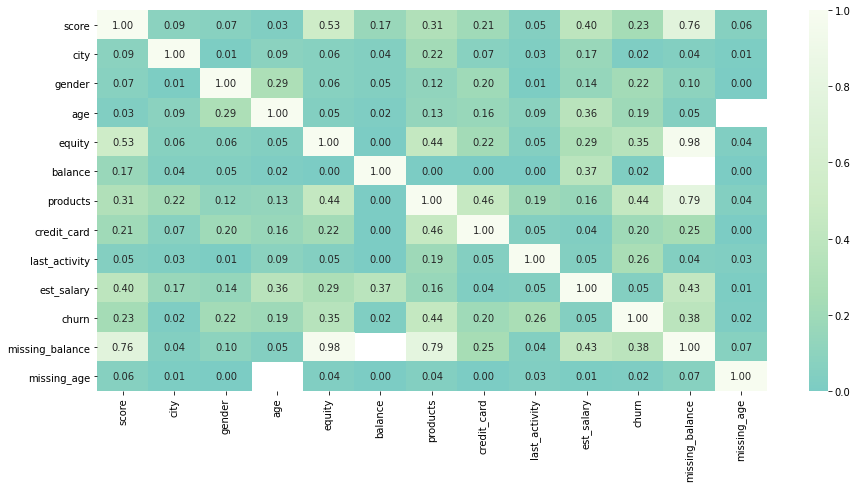

In [9]:
# уберем предупреждение из выдачи
warnings.filterwarnings("ignore", module='phik.*')
# создадим матрицу корреляций phik
phik_matrix = data_copy.drop(columns=['user_id']).phik_matrix(interval_cols=['score', 'age', 'balance', 'est_salary'])
# построим график для лучшей визуализации
plt.figure(figsize=[15, 7])
sns.heatmap(phik_matrix, cmap='GnBu_r', center=0, annot=True, fmt='0.2f');

Согласно шкале Чеддока, есть весьма высокая  связь между пропущенными значениями в балансе и количеством баллов собственности (0.98).  
Более того есть высокая связь между пропущенными значениями в балансе и количеством продуктов, которыми пользуется клиент (0.79), и количеством баллов кредитного скоринга (0.76).  
Также есть умеренная связь между пропущенными значениями в балансе и доходом (0.43) и оттоком (0.38).  
Дополнительно у пропущенных значений в балансе есть слабая связь с наличием кредитной карты (0.25) и полом (0.1).  
Не была найдена связь между пропущенными значениями в балансе и возрастом (0.05), активностью (0.04) и городом (0.04). 

В связи с этим пропуски в балансе можно отнести к категории MNAR (Missing Not At Random / Отсутствует не случайно), поэтому мы не будем их отбрасывать или заполнять одним значением, так как это приведёт к заметным искажениям.

У пропущенных значений в возрасте не было найдено корреляции с другими признаками. Эти пропуски можно отнести к категории MAR (Missing At Random / Отсутствует случайно), но и их мы не будем отбрасывать, так как они представляют незначительную долю от всех значений.

#### Обработка дубликатов

Проверим, есть ли явные дубликаты в датафрейме.

In [10]:
data.duplicated().sum()

0

Проверим дубликаты по столбцу с идентификаторами клиентов.

In [11]:
data[data.duplicated(subset='user_id', keep=False)].sort_values(by='user_id').head(20)

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
1893,116540,883.0,Рыбинск,Ж,55.0,1,362756.49,3,0,1,175920.48,1
7694,116540,887.0,Ярославль,Ж,38.0,0,NaN,1,0,1,119247.61,0
7542,117943,880.0,Ярославль,Ж,40.0,0,NaN,1,1,0,137718.93,0
4866,117943,855.0,Рыбинск,Ж,32.0,6,1036832.93,4,1,1,107792.71,1
5896,120258,905.0,Ярославль,М,30.0,0,NaN,1,1,1,146427.96,0
5863,120258,908.0,Рыбинск,Ж,38.0,4,2213581.63,2,0,1,160327.77,1
1411,123461,829.0,Ярославль,Ж,59.0,0,96222.44,2,0,1,102771.55,1
8638,123461,934.0,Рыбинск,М,34.0,0,NaN,2,1,0,291619.27,0
8164,124450,859.0,Ярославль,Ж,38.0,6,516811.20,1,1,1,95144.63,1
9775,124450,758.0,Рыбинск,Ж,36.0,0,73574.07,2,0,1,79963.59,0


Мы видим, что идентификаторы клиентов дублируются в Ярославле и Рыбинске, при этом клиенты под одинаковыми идентификаторами могут быть разного пола и возраста и иметь разные оценочные доходы.

Это указывает на то, что вероятнее всего причина появления дубликатов не в том, что один и тот же клиент обращался в разные филиалы, а в технической ошибке или в том, что идентификаторы уникальны только в пределах одного филиала. В связи с этим, мы не будем дополнительно обрабатывать дубликаты.

## Исследовательский анализ данных

### Объем и доля оттока

Рассчитаем объем и долю оттока от общего числа клиентов.

In [12]:
# рассчитаем количество ушедших клиентов
data.query('churn == 1')['user_id'].count()

1820

In [13]:
# рассчитаем долю ушедших клиентов в %
data.query('churn == 1')['user_id'].count()/data['user_id'].count()*100

18.2

1820 клиентов (18.2%) ушли из банка.

### Распределение переменных

Изучим распределение параметров клиентов агрегированно и в разерезе оттока.

#### Распределение клиентов по баллам кредитного скоринга

Построим график распределения клиентов по баллам кредитного скоринга агрегированно и в разрезе оттока.

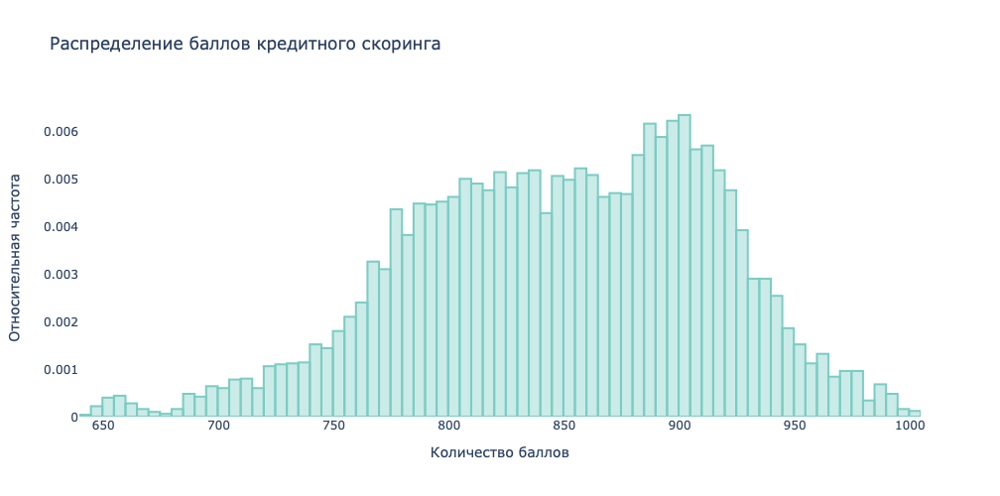

In [14]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data['score'],
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение баллов кредитного скоринга',
                  xaxis_title='Количество баллов',
                  yaxis_title='Относительная частота',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

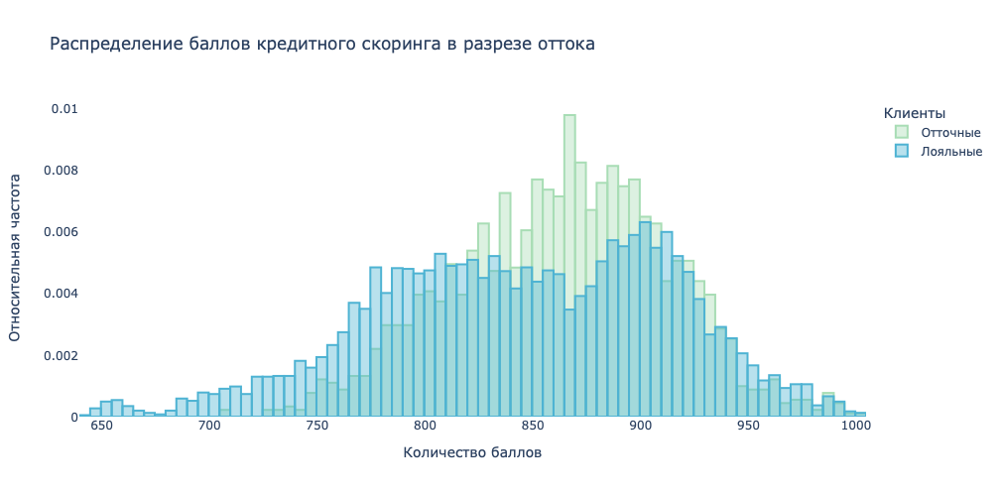

In [15]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data.query('churn == 1')['score'],
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2
    ))

fig.add_trace(go.Histogram(
        x=data.query('churn == 0')['score'],
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение баллов кредитного скоринга в разрезе оттока',
                  xaxis_title='Количество баллов',
                  yaxis_title='Относительная частота',
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что в распределении клиентов по баллам кредитного скоринга у отточных и лояльных клиентов нет значительных различий, кроме того, что у лояльных клиентов этот показатель более равномерно распределен.

В основном количество баллов находится в промежутке от 775 до 935.

#### Распределение клиентов по городам

Построим график распределения клиентов по городам агрегированно и в разрезе оттока.

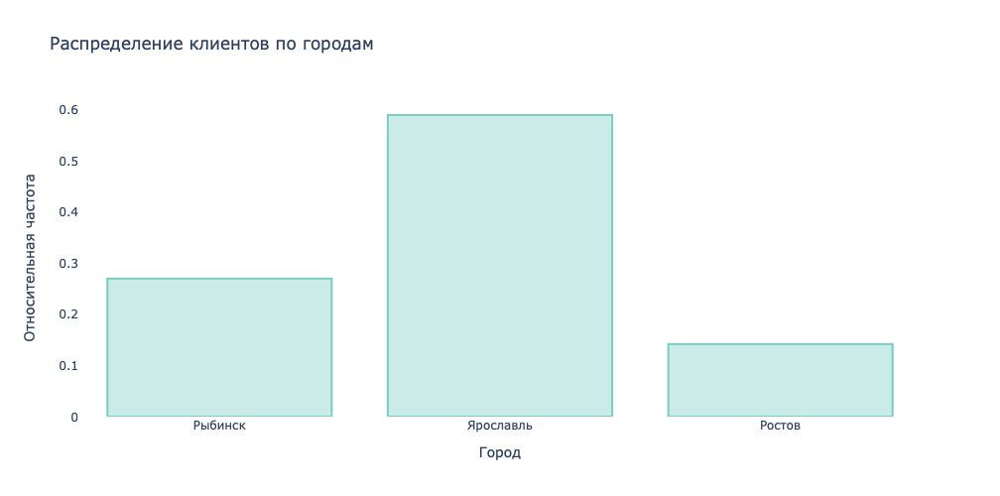

In [16]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data['city'],
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по городам',
                  xaxis_title='Город',
                  yaxis_title='Относительная частота',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

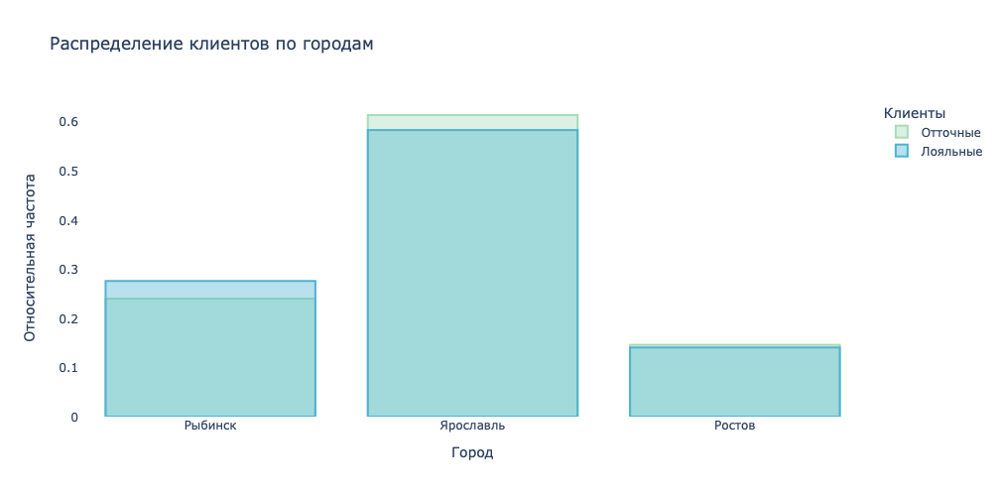

In [17]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data.query('churn == 1')['city'],
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2
    ))

fig.add_trace(go.Histogram(
        x=data.query('churn == 0')['city'],
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по городам',
                  xaxis_title='Город',
                  yaxis_title='Относительная частота',
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что распределение клиентов по городам примерно одинаковое у лояльных и отточных клиентов: около 60% клиентов обслуживаются в Ярославле, 26% - в Рыбинске, 14% - в Ростове.

#### Распределение клиентов по полу

Построим график распределения клиентов по полу агрегированно и в разрезе оттока.

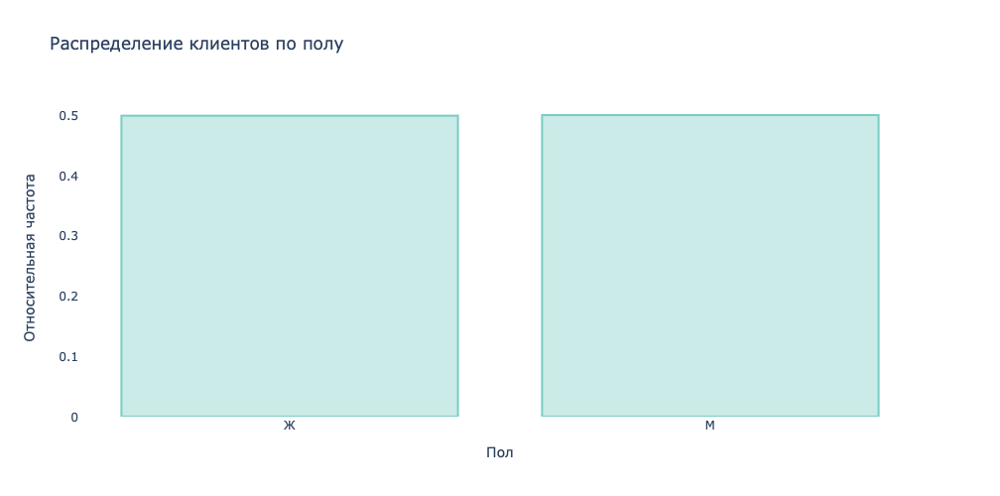

In [18]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data['gender'],
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по полу',
                  xaxis_title='Пол',
                  yaxis_title='Относительная частота',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

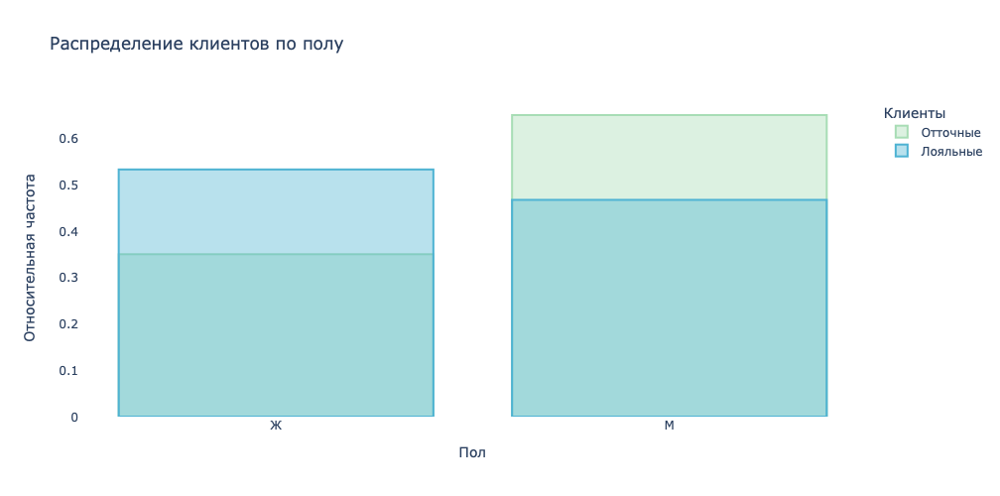

In [19]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data.query('churn == 1')['gender'],
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2
    ))

fig.add_trace(go.Histogram(
        x=data.query('churn == 0')['gender'],
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по полу',
                  xaxis_title='Пол',
                  yaxis_title='Относительная частота',
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что в целом распределение клиентов по полу равномерное - мужчин и женщин среди клиентов поровну.

При этом среди отточных клиентов гораздо больше мужчин - 65%, а среди лояльных клиентов чуть больше женщин - 53%.

#### Распределение клиентов по возрасту

Построим график распределения клиентов по возрасту агрегированно и в разрезе оттока.

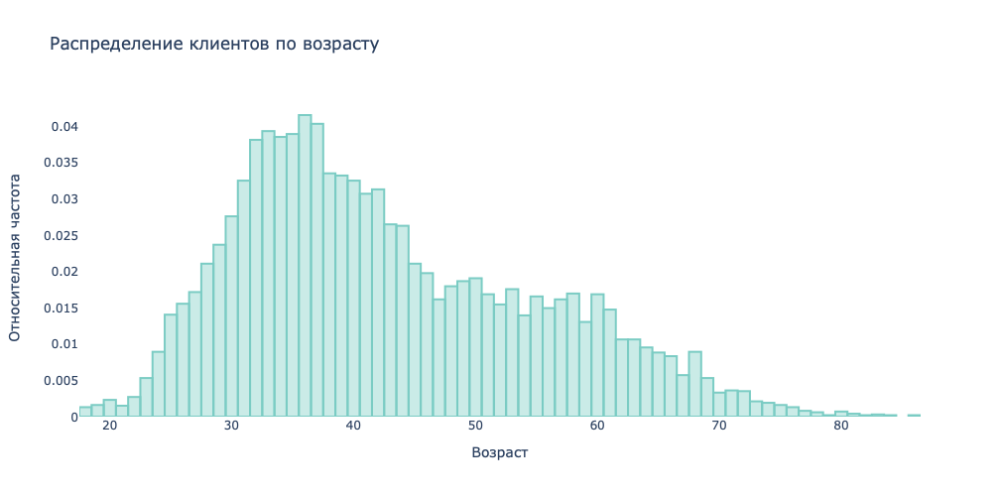

In [20]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=pd.Series(data['age']).dropna(),
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по возрасту',
                  xaxis_title='Возраст',
                  yaxis_title='Относительная частота',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

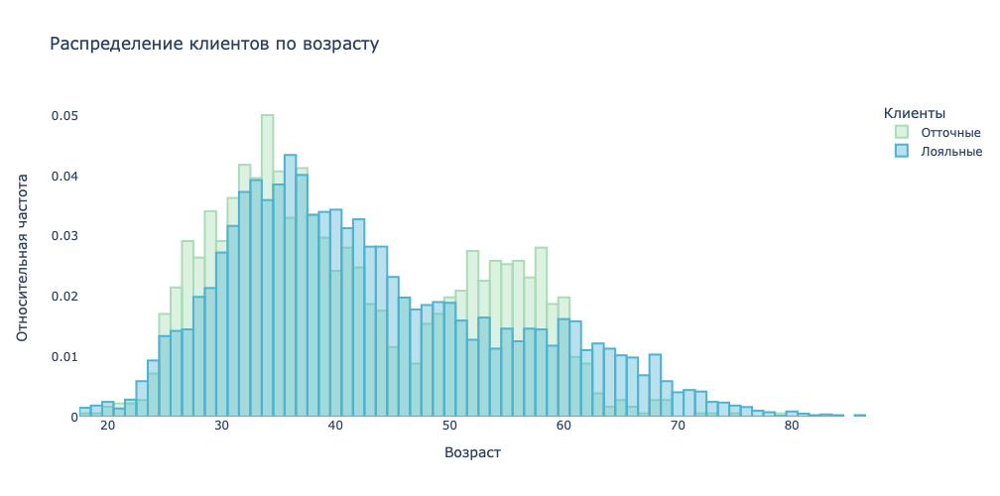

In [21]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=pd.Series(data.query('churn == 1')['age']).dropna(),
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2,
        xbins=dict(size=1)
    ))

fig.add_trace(go.Histogram(
        x=pd.Series(data.query('churn == 0')['age']).dropna(),
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по возрасту',
                  xaxis_title='Возраст',
                  yaxis_title='Относительная частота',
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что в основном клиенты банка находятся в возрасте от 30 до 50 лет.

При этом среди отточных клиентов есть большое количество человек в возрасте от 50 до 60 лет.

#### Распределение клиентов по баллам собственности

Построим график распределения клиентов по баллам собственности агрегированно и в разрезе оттока.

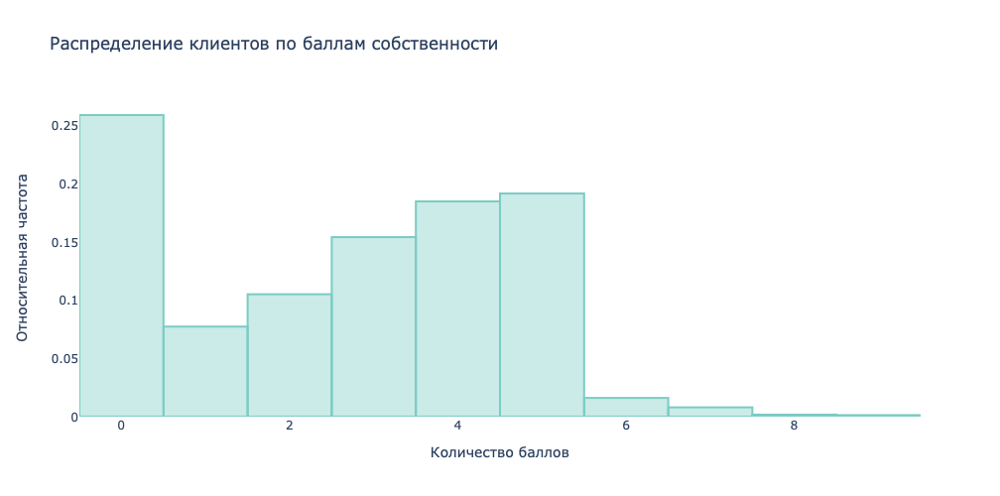

In [22]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data['equity'],
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по баллам собственности',
                  xaxis_title='Количество баллов',
                  yaxis_title='Относительная частота',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

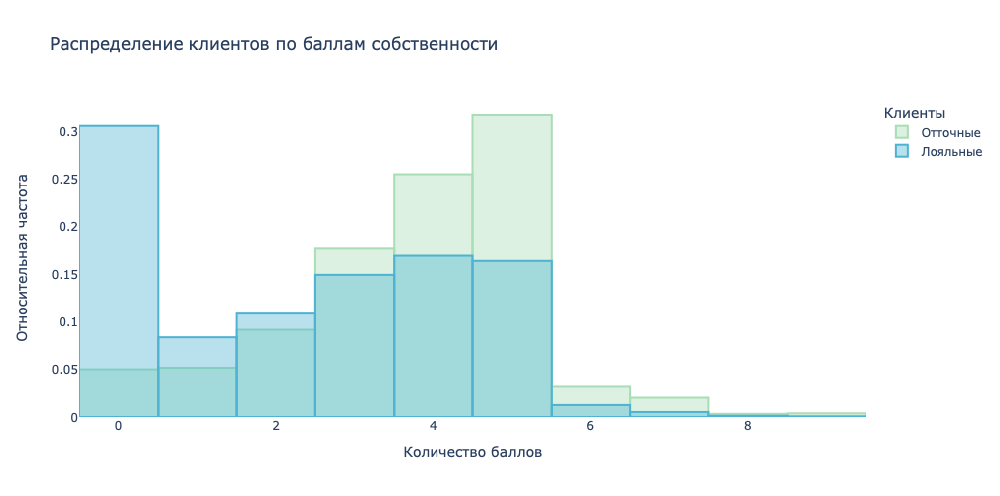

In [23]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data.query('churn == 1')['equity'],
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2
    ))

fig.add_trace(go.Histogram(
        x=data.query('churn == 0')['equity'],
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по баллам собственности',
                  xaxis_title='Количество баллов',
                  yaxis_title='Относительная частота',
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что у лояльных клиентов зачастую нет собственности, а у отточных клиентов наоборот: от 3 до 5 баллов собственности.

#### Распределение клиентов по балансу

Построим график распределения клиентов по балансу агрегированно и в разрезе оттока.

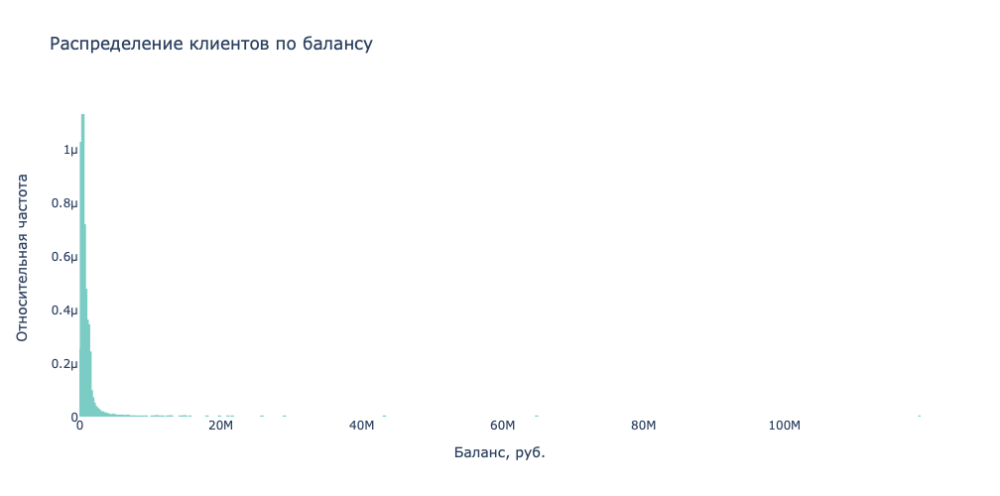

In [24]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=pd.Series(data['balance']).dropna(),
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по балансу',
                  xaxis_title='Баланс, руб.',
                  yaxis_title='Относительная частота',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

Ограничим график по оси х, чтобы детальнее рассмотреть распределение.

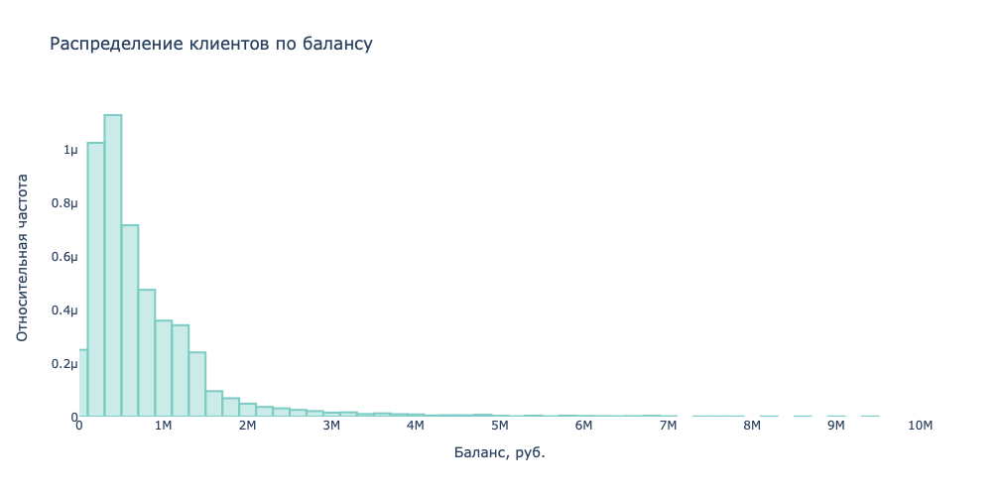

In [25]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=pd.Series(data['balance']).dropna(),
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по балансу',
                  xaxis_title='Баланс, руб.',
                  yaxis_title='Относительная частота',
                  xaxis=dict(range=[0, 10000000]),
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

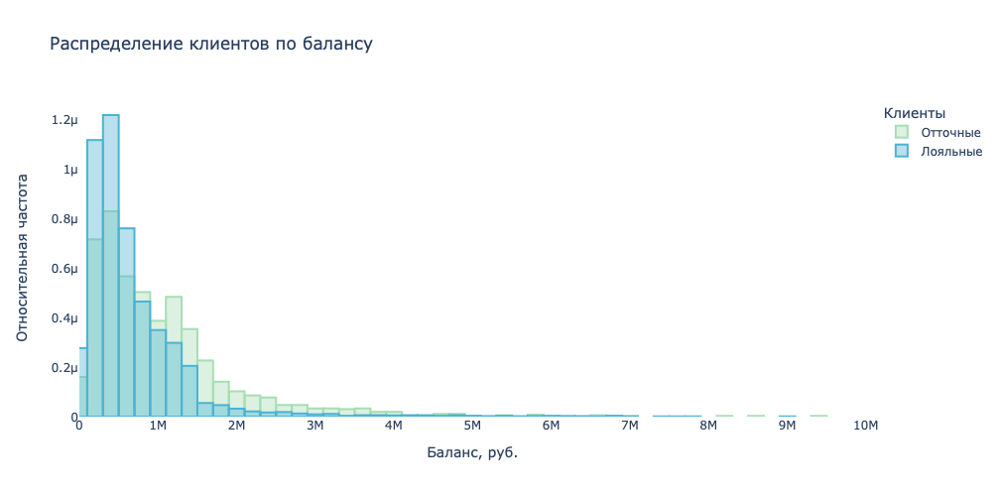

In [26]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=pd.Series(data.query('churn == 1')['balance']).dropna(),
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2,
        xbins=dict(size=200000)
    ))

fig.add_trace(go.Histogram(
        x=pd.Series(data.query('churn == 0')['balance']).dropna(),
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по балансу',
                  xaxis_title='Баланс, руб.',
                  yaxis_title='Относительная частота',
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  xaxis=dict(range=[0, 10000000]),
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что зачастую у отточных клиентов баланс на счете выше, чем у лояльных клиентов.

#### Распределение клиентов по количеству продуктов

Для начала изучим клиентов, у которых указано 0 используемых продуктов, ведь если человек является клиентом банка, он должен пользоваться хотя бы одним банковским продуктом.

In [14]:
data.query('products == 0')

,user_id,score,city,gender,age,equity,balance,products,credit_card,last_activity,est_salary,churn
8957,147837,962.0,Рыбинск,Ж,79.0,3,NaN,0,0,0,25063.96,1


В датафрейме всего один клиент, у которого нет продуктов. Исключим его из анализа, чтобы он не повлиял на результаты исследования.

In [15]:
data = data.query('products > 0')

Теперь построим график распределения клиентов по количеству продуктов агрегированно и в разрезе оттока.

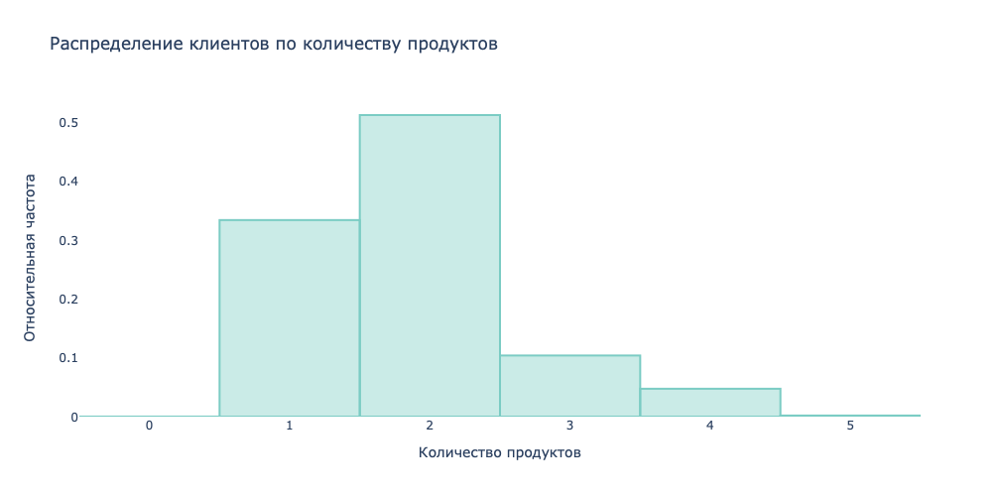

In [27]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data['products'],
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по количеству продуктов',
                  xaxis_title='Количество продуктов',
                  yaxis_title='Относительная частота',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

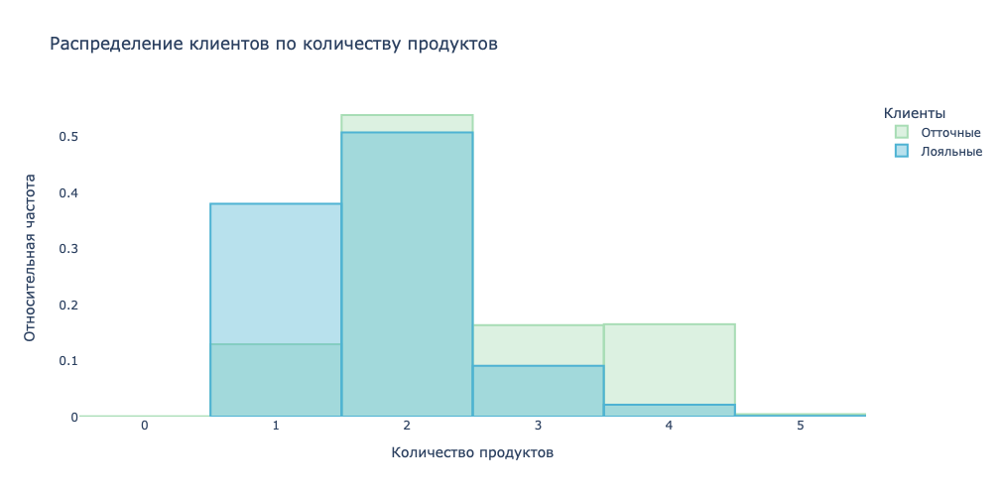

In [28]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data.query('churn == 1')['products'],
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2
    ))

fig.add_trace(go.Histogram(
        x=data.query('churn == 0')['products'],
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по количеству продуктов',
                  xaxis_title='Количество продуктов',
                  yaxis_title='Относительная частота',
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что у большинства клиентов 2 банковских продукта.

Кроме того, у отточных клиентов зачастую больше продуктов (от 2 до 4 продуктов), чем у лояльных (1-2 продукта).

#### Распределение клиентов по наличию кредитной карты

Построим график распределения клиентов по наличию кредитной карты агрегированно и в разрезе оттока.

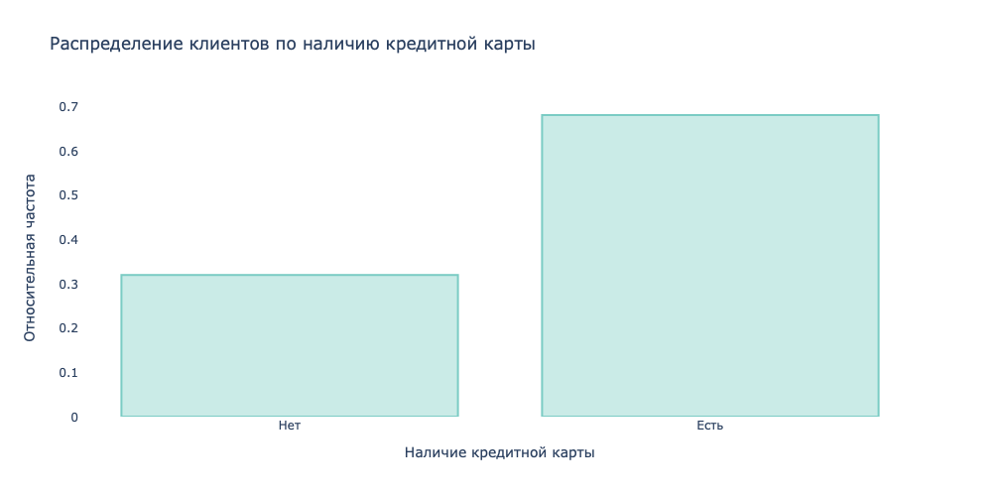

In [29]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data['credit_card'].astype('bool'),
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по наличию кредитной карты',
                  xaxis_title='Наличие кредитной карты',
                  yaxis_title='Относительная частота',
                  xaxis=dict(
                  tickmode='array',
                      tickvals=['false', 'true'],
                      ticktext=['Нет', 'Есть']),
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

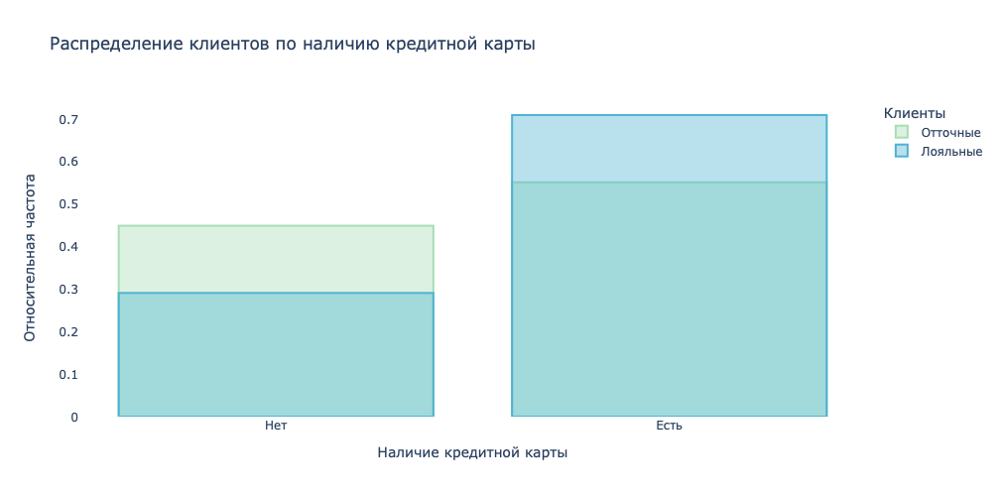

In [30]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data.query('churn == 1')['credit_card'].astype('bool'),
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2
    ))

fig.add_trace(go.Histogram(
        x=data.query('churn == 0')['credit_card'].astype('bool'),
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по наличию кредитной карты',
                  xaxis_title='Наличие кредитной карты',
                  yaxis_title='Относительная частота',
                  xaxis=dict(
                  tickmode='array',
                      tickvals=['false', 'true'],
                      ticktext=['Нет', 'Есть']),
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что у большинства клиентов (68%) есть кредитная карта. При этом мы видим, что этот показатель ниже у отточных клиентов (55%).

#### Распределение клиентов по активности

Построим график распределения клиентов по признаку активности агрегированно и в разрезе оттока.

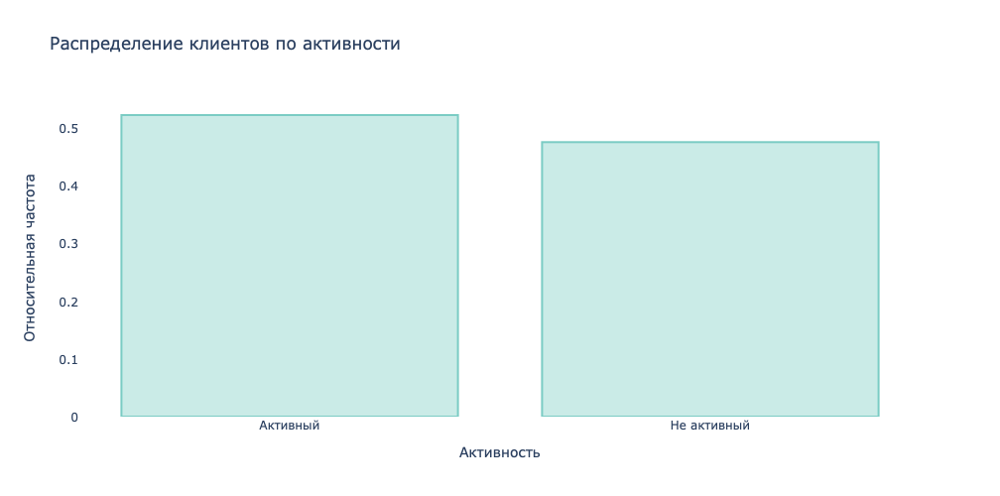

In [31]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data['last_activity'].astype('bool'),
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по активности',
                  xaxis_title='Активность',
                  yaxis_title='Относительная частота',
                  xaxis=dict(
                  tickmode='array',
                      tickvals=['false', 'true'],
                      ticktext=['Не активный', 'Активный']),
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

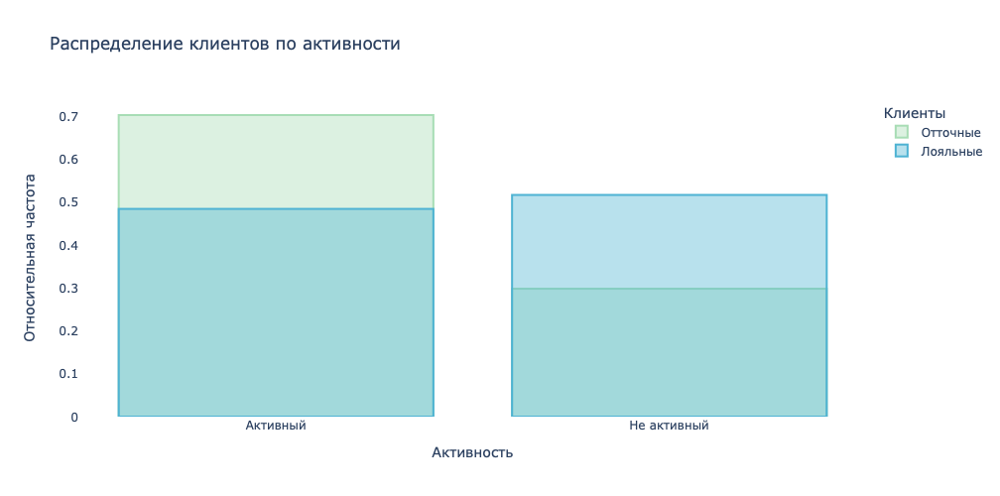

In [32]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=data.query('churn == 1')['last_activity'].astype('bool'),
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2
    ))

fig.add_trace(go.Histogram(
        x=data.query('churn == 0')['last_activity'].astype('bool'),
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по активности',
                  xaxis_title='Активность',
                  yaxis_title='Относительная частота',
                  xaxis=dict(
                  tickmode='array',
                      tickvals=['false', 'true'],
                      ticktext=['Не активный', 'Активный']),
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что в банке примерно поровну активных и не активных клиентов. Однако, среди отточных клиентов гораздо больше активных клиентов (70%).

#### Распределение клиентов по оценочному доходу

Построим график распределения клиентов по оценочному доходу агрегированно и в разрезе оттока.

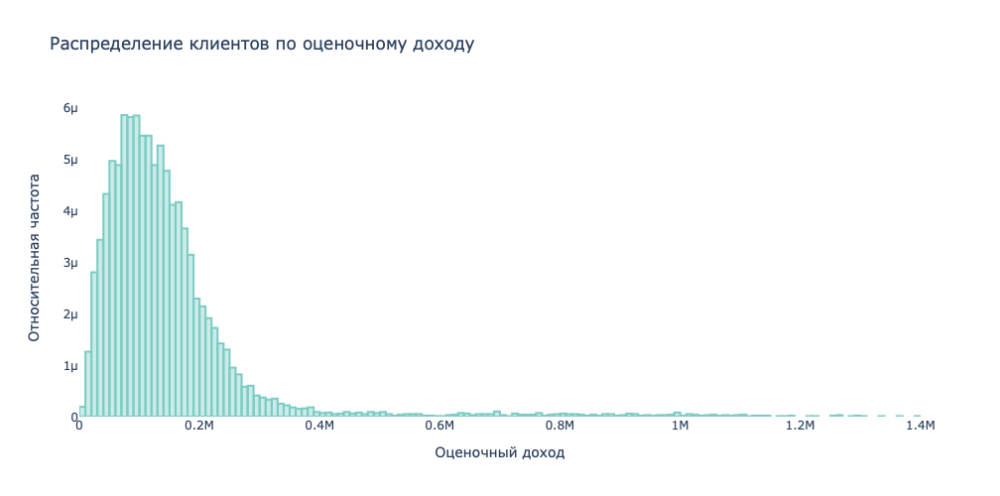

In [33]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=pd.Series(data['est_salary']).dropna(),
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по оценочному доходу',
                  xaxis_title='Оценочный доход',
                  yaxis_title='Относительная частота',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

Ограничим график по оси х, чтобы детальнее рассмотреть распределение.

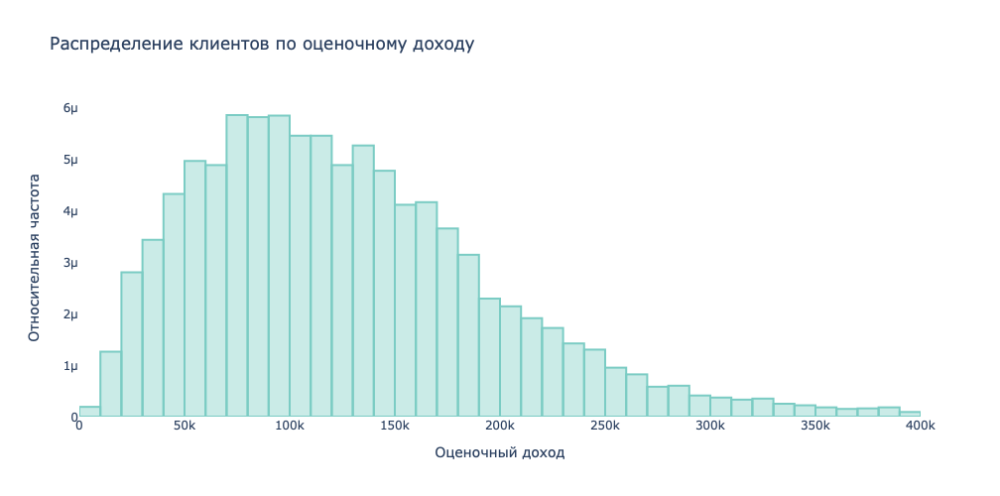

In [34]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=pd.Series(data['est_salary']).dropna(),
        histnorm='probability density',
        marker_color='rgba(123, 204, 196, 0.4)',
        marker_line_color='rgba(123, 204, 196, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по оценочному доходу',
                  xaxis_title='Оценочный доход',
                  yaxis_title='Относительная частота',
                  xaxis=dict(range=[0, 400000]),
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

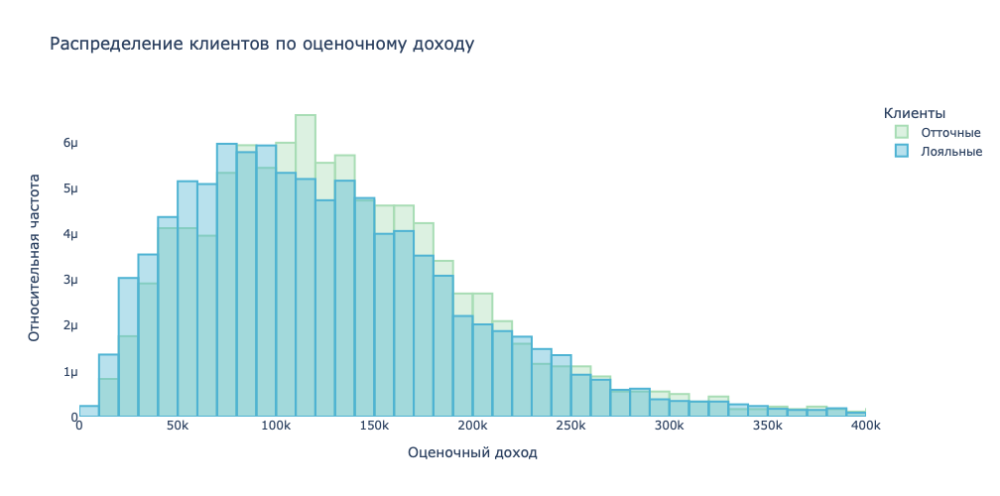

In [35]:
fig = go.Figure()

fig.add_trace(go.Histogram(
        x=pd.Series(data.query('churn == 1')['est_salary']).dropna(),
        histnorm='probability density',
        name='Отточные',
        marker_color='rgba(168, 221, 181, 0.4)',
        marker_line_color='rgba(168, 221, 181, 1)',
        marker_line_width=2,
        xbins=dict(size=10000)
    ))

fig.add_trace(go.Histogram(
        x=pd.Series(data.query('churn == 0')['est_salary']).dropna(),
        histnorm='probability density',
        name='Лояльные',
        marker_color='rgba(78, 179, 211, 0.4)',
        marker_line_color='rgba(78, 179, 211, 1)',
        marker_line_width=2
    ))

fig.update_layout(title_text='Распределение клиентов по оценочному доходу',
                  xaxis_title='Оценочный доход',
                  yaxis_title='Относительная частота',
                  legend_title_text='Клиенты',
                  barmode='overlay',
                  xaxis=dict(range=[0, 400000]),
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графиках видно, что у большинства клиентов оценночный доход не превышает 200 тысяч и распределение клиентов по оценочному доходу примерно одинаковое у отточных и лояльных клиентов.

### Корреляция

Изучим корреляцию оттока с другими параметрами клиентов.

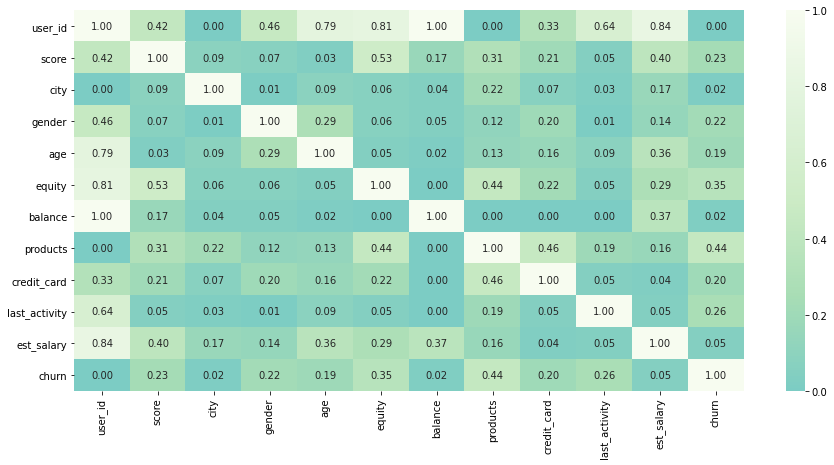

In [10]:
# создадим матрицу корреляций phik
phik_matrix = data.phik_matrix(interval_cols=['score', 'age', 'balance', 'est_salary'])
# построим график для лучшей визуализации
plt.figure(figsize=[15, 7])
sns.heatmap(phik_matrix, cmap='GnBu_r', center=0, annot=True, fmt='0.2f');

Согласно шкале Чеддока, есть умеренная связь между оттоком и количеством баллов собственности (0.35).

Также есть слабая связь между оттоком и активностью (0.26), количеством используемых продуктов (0.26), количеством баллов кредитного скоринга (0.23), полом (0.22), наличием кредитной карты (0.20) и возрастом (0.19).

Не была найдена связь между оттоком и доходом (0.05), балансом (0.02) и городом (0.02). 

### Портрет клиента

Составим портрет клиента в разрезе оттока. Для этого составим таблицу, где по каждому признаку будет посчитана мера центральной тенденции и относительная разница между значениями этой меры у отточных и лояльных клиентов.

In [38]:
# создадим сводную таблицу со средними значениями
mean = data.pivot_table(columns='churn', aggfunc={
    'score':'mean',
    'age':'mean',
    'balance':'mean',
    'est_salary':'mean'
})
# переименуем столбцы
mean = mean.rename(columns={0:'Лояльные клиенты', 1:'Отточные клиенты'})
# рассчитаем относительную разницу
mean['Относительная разница, %'] = (mean['Отточные клиенты']/mean['Лояльные клиенты'] - 1)*100


# создадим сводную таблицу с медианными значениями
median = data.pivot_table(columns='churn', aggfunc={
    'equity':'median',
    'products':'median'
})
# переименуем столбцы
median = median.rename(columns={0:'Лояльные клиенты', 1:'Отточные клиенты'})


# создадим таблицу с модой
mode = data.groupby('churn').agg(lambda x: x.mode()[0])[['city', 'gender', 'credit_card', 'last_activity']].T
# переименуем столбцы
mode = mode.rename(columns={0:'Лояльные клиенты', 1:'Отточные клиенты'})


# объединим таблицы
portrait = pd.concat([mean, median, mode], axis=0).fillna('')


portrait

churn,Лояльные клиенты,Отточные клиенты,"Относительная разница, %"
age,43.020846,41.450247,-3.650785
balance,733982.585648,1133993.27145,54.498662
est_salary,147783.200108,148243.010198,0.311138
score,845.428362,863.401099,2.125873
equity,3,4,
products,2,2,
city,Ярославль,Ярославль,
gender,Ж,М,
credit_card,1,1,
last_activity,0,1,


Основные различия в портрете клиента между отточным и лояльным клиентом заключается в следующем:
- В среднем у отточных клиентов баланс в два раза выше, чем у лояльных клиентов, и находится на уровне 1,1М рублей
- Средний доход у отточного клиента выше, чем у лояльного клиента, и составляет 148К рублей
- В среднем у отточного клиента больше баллов кредитного скоринга, чем у лояльного клиента - около 863
- Средний возраст отточного клиента чуть ниже возраста лояльного клиента и составляет 41 год
- Зачастую у отточных клиентов больше баллов собственности, чем у лоляьных клиентоа - около 4
- Отточные клиенты как правило мужчины
- Отточные клиенты зачастую активные, что не сказать о лояльных клиентах

## Статистический анализ данных

### Формулирование гипотез

На основе проведенного анализа мы сформулировали следующие гипотезы:
1. У отточных клиентов больше баллов собственности, чем у лояльных клиентов.
2. У отточных клиентов доход выше, чем у лояльных клиентов.
3. У отточных клиентов баланс выше, чем у лояльных клиентов.
4. У отточных клиентов больше баллов кредитного скоринга, чем у лояльных клиентов.
5. Отточные клиенты пользуются большим количеством продуктов, чем лояльные клиенты.
6. Среди отточных клиентов больше активных клиентов, чем среди лояльных клиентов.

### Проверка гипотез

Для проверки гипотез установим уровень статистической значимости в 1%.

In [39]:
alpha = 0.01

#### 1. У отточных клиентов больше баллов собственности, чем у лояльных клиентов

Сформулируем нулевую и альтернативную гипотезы:  
* Нулевая гипотеза: У отточных и оляльных клиентов одинаковое количество баллов собственности.
* Альтернативная гипотеза: У отточных клиентов больше баллов собственности, чем у лояльных клиентов.

Для того, чтобы определить какой тест применить для проверки данной гипотезы, изучим подробнее распределение количества баллов собственности.

Для начала нужно проверить гипотезу о том, что количество баллов собственности имеет нормальное распределение. Для этого применим критерий Шапиро-Уилка:
- Нулевая гипотеза: Количество баллов собственности распределено нормально.
- Альтернативная гипотеза: Количество баллов собственности распределено не нормально.

In [40]:
# уберем предупреждение из выдачи
warnings.filterwarnings("ignore", module='scipy.*')
# проведем тест
shap1 = st.shapiro(data['equity'])
p_value_shap1 = shap1[1]

print('p-значение: ', p_value_shap1)

if p_value_shap1 < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу') 

p-значение:  0.0
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что количество баллов собственности распределено не нормально, поэтому для проверки будем использовать непараметрический тест Манна-Уитни.

In [41]:
hyp1 = st.mannwhitneyu(
    data.query('churn == 1')['equity'],
    data.query('churn == 0')['equity'],
    alternative='greater')

print('p-значение: ', hyp1.pvalue)

if hyp1.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

p-значение:  1.1136352022311862e-158
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что у отточных клиентов больше баллов собственности, чем у лояльных клиентов.

#### 2. У отточных клиентов доход выше, чем у лояльных клиентов

Сформулируем нулевую и альтернативную гипотезы:  
* Нулевая гипотеза: У отточных клиентов доход не отличается от дохода лояльных клиентов.
* Альтернативная гипотеза: У отточных клиентов доход выше, чем у лояльных клиентов.

Для того, чтобы определить какой тест применить для проверки данной гипотезы, изучим подробнее распределение дохода.

Для начала нужно проверить гипотезу о том, что доход имеет нормальное распределение. Для этого применим критерий Шапиро-Уилка:
- Нулевая гипотеза: Доход распределен нормально.
- Альтернативная гипотеза: Доход распределен не нормально.

In [42]:
# проведем тест
shap2 = st.shapiro(data['est_salary'])
p_value_shap2 = shap2[1]

print('p-значение: ', p_value_shap2)

if p_value_shap2 < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

p-значение:  0.0
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что доход распределен не нормально, поэтому для проверки будем использовать непараметрический тест Манна-Уитни.

In [43]:
hyp2 = st.mannwhitneyu(
    data.query('churn == 1')['est_salary'],
    data.query('churn == 0')['est_salary'],
    alternative='greater')

print('p-значение: ', hyp2.pvalue)

if hyp2.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

p-значение:  0.0001217796364058475
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что у отточных клиентов доход выше, чем у лояльных клиентов.

#### 3. У отточных клиентов баланс выше, чем у лояльных клиентов

Сформулируем нулевую и альтернативную гипотезы:  
* Нулевая гипотеза: У отточных клиентов баланс не отличается от баланса лояльных клиентов.
* Альтернативная гипотеза: У отточных клиентов баланс выше, чем у лояльных клиентов.

Для того, чтобы определить какой тест применить для проверки данной гипотезы, изучим подробнее распределение баланса.

Для начала нужно проверить гипотезу о том, что баланс имеет нормальное распределение. Для этого применим критерий Шапиро-Уилка:
- Нулевая гипотеза: Баланс распределен нормально.
- Альтернативная гипотеза: Баланс распределен не нормально.

In [44]:
# проведем тест
shap3 = st.shapiro(data['balance'])
p_value_shap3 = shap3[1]

print('p-значение: ', p_value_shap3)

if p_value_shap3 < alpha:
     print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

p-значение:  1.0
Не получилось отвергнуть нулевую гипотезу


В результате проведения теста не получилось отвергнуть нулевую гипотезу. Следовательно, нет достаточно статистических оснований полагать, что баланс распределен не нормально, поэтому для проверки будем использовать t-test с независимыми выборками.

Проверим, равные ли дисперсии у выборок при помощи F-test:
- Нулевая гипотеза: Дисперсии выборок одинаковые.
- Альтернативная гипотеза: Дисперсии выборок отличаются.

In [45]:
# рассчитаем дисперсии выборок
variance1 = np.var(data.query('churn == 1')['balance'])
variance2 = np.var(data.query('churn == 0')['balance'])
 
# рассчитаем F
f_value = variance1 / variance2
 
# рассчитаем степени свободы
df1 = len(data.query('churn == 1')['balance']) - 1
df2 = len(data.query('churn == 0')['balance']) - 1
 
# проведем тест
p_value_f3 = st.f.cdf(f_value, df1, df2)

print('p-значение: ', p_value_f3)

if p_value_f3 < alpha:
     print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

p-значение:  0.9856559289654269
Не получилось отвергнуть нулевую гипотезу


В результате проведения теста не получилось отвергнуть нулевую гипотезу. Следовательно, нет достаточно статистических оснований полагать, что дисперсии выборок отличаются.

Проведем проверку основной гипотезы.

In [46]:
hyp3 = st.ttest_ind(
    data.query('churn == 1')['balance'],
    data.query('churn == 0')['balance'],
    alternative='greater',
    nan_policy='omit'
)

print('p-значение:', hyp3.pvalue)

if hyp3.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу') 

p-значение: 2.6480503286961e-14
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что у отточных клиентов баланс выше, чем у лояльных клиентов.

#### 4. У отточных клиентов больше баллов кредитного скоринга, чем у лояльных клиентов

Сформулируем нулевую и альтернативную гипотезы:  
* Нулевая гипотеза: У отточных и оляльных клиентов одинаковое количество баллов кредитного скоринга.
* Альтернативная гипотеза: У отточных клиентов больше баллов кредитного скоринга, чем у лояльных клиентов.

Для того, чтобы определить какой тест применить для проверки данной гипотезы, изучим подробнее распределение количества баллов кредитного скоринга.

Для начала нужно проверить гипотезу о том, что количество баллов кредитного скоринга имеет нормальное распределение. Для этого применим критерий Шапиро-Уилка:
- Нулевая гипотеза: Количество баллов кредитного скоринга распределено нормально.
- Альтернативная гипотеза: Количество баллов кредитного скоринга распределено не нормально.

In [47]:
# проведем тест
shap4 = st.shapiro(data['score'])
p_value_shap4 = shap4[1]

print('p-значение: ', p_value_shap4)

if p_value_shap4 < alpha:
     print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

p-значение:  6.347277688067291e-28
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что количество баллов кредитного скоринга распределено не нормально, поэтому для проверки будем использовать непараметрический тест Манна-Уитни.

In [48]:
hyp4 = st.mannwhitneyu(data.query('churn == 1')['score'], data.query('churn == 0')['score'], alternative='greater')

print('p-значение: ', hyp4.pvalue)

if hyp4.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

p-значение:  2.707457624365627e-22
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что у отточных клиентов больше баллов кредитного скоринга, чем у лояльных клиентов.

#### 5. Отточные клиенты пользуются большим количеством продуктов, чем лояльные клиенты

Сформулируем нулевую и альтернативную гипотезы:  
* Нулевая гипотеза: Отточные и лояльные клиенты пользуются одинаковым количеством продуктов.
* Альтернативная гипотеза: Отточные клиенты пользуются большим количеством продуктов, чем лояльные клиенты.

Для того, чтобы определить какой тест применить для проверки данной гипотезы, изучим подробнее количества используемых продуктов.

Для начала нужно проверить гипотезу о том, что количество используемых продуктов имеет нормальное распределение. Для этого применим критерий Шапиро-Уилка:
- Нулевая гипотеза: Количество используемых продуктов распределено нормально.
- Альтернативная гипотеза: Количество используемых продуктов распределено не нормально.

In [49]:
# проведем тест
shap5 = st.shapiro(data['products'])
p_value_shap5 = shap5[1]

print('p-значение: ', p_value_shap5)

if p_value_shap5 < alpha:
     print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу')

p-значение:  0.0
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что количество используемых продуктов распределено не нормально, поэтому для проверки будем использовать непараметрический тест Манна-Уитни.

In [50]:
hyp5 = st.mannwhitneyu(data.query('churn == 1')['products'], data.query('churn == 0')['products'], alternative='greater')

print('p-значение: ', hyp5.pvalue)

if hyp5.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу') 

p-значение:  3.370568846434347e-162
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что отточные клиенты пользуются большим количеством продуктов, чем лояльные клиенты.

#### 6. Среди отточных клиентов больше активных клиентов, чем среди лояльных клиентов

Сформулируем нулевую и альтернативную гипотезы:  
* Нулевая гипотеза: Среди отточных и лояльных клиентов одинаковая доля активных клиентов.
* Альтернативная гипотеза: Среди отточных клиентов больше активных клиентов, чем среди лояльных клиентов.

Для проверки данной гипотезы будем использовать z-test .

In [51]:
# рассчитаем пропорции активных клиентов
p1 = data.query('churn == 1 and last_activity == 1')['user_id'].count()/data.query('churn == 1')['user_id'].count()
p2 = data.query('churn == 0 and last_activity == 1')['user_id'].count()/data.query('churn == 0')['user_id'].count()

p_combined = (data.query('churn == 1 and last_activity == 1')['user_id'].count() + 
    data.query('churn == 0 and last_activity == 1')['user_id'].count()) / data['user_id'].count()

# рассчитаем разницу пропорций в выборках
difference = p1 - p2 

# рассчитаем Z
z_value = difference / mth.sqrt(
    p_combined * (1 - p_combined) * (1/data.query('churn == 1')['user_id'].count() + 
                                     1/data.query('churn == 0')['user_id'].count())
)

# зададим стандартное нормальное распределение
distr = st.norm(0, 1)  

# проведем тест
p_value = (1 - distr.cdf(abs(z_value))) * 2

print('p-значение: ', hyp5.pvalue)

if hyp5.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу') 

p-значение:  3.370568846434347e-162
Отвергаем нулевую гипотезу


В результате проведения теста мы отвергаем нулевую гипотезу. Следовательно, есть достаточно статистических оснований полагать, что среди отточных клиентов больше активных клиентов, чем среди лояльных клиентов.

## Подведение промежуточных итогов

Исходя из проведенного анализа мы можем выделим признаки, влияющие на отток клиентов:
- Пол:  
Зачастую отточные клиенты - мужчины
- Возраст:  
Отточные клиенты зачастую находятся в возрасте от 25 до 45 лет и от 50 до 60 лет
- Баллы собственности:  
У отточных клиентов больше баллов собственности, чем у лояльных клиентов, в среднем 4
- Доход:  
Средний доход отточного клиента выше среднего дохода лояльного клиента и составляет 148К рублей
- Баланс:  
Баланс у отточного клиента в среднем в два раза выше, чем баланс у лояльного клиента, и находится на уровне 1,1М рублей
- Баллы кредитного скоринга:   
У отточных клиентов больше баллов кредитного скоринга, чем у лояльных клиентов, в среднем 863
- Количество используемых продуктов:  
Как правило отточные клиенты пользуются большим количеством продуктов, чем лояльные клиенты - от 2 до 4
- Признак активности:  
Среди отточных клиентов больше активных клиентов, чем среди лояльных клиентов.

## Сегментация

### Формирование сегментов

На основе выделенных признаков, влияющих на отток клиентов, мы сформировали следующие сегменты:
1. Состоятельные клиенты
2. Активные клиенты
3. Мужчины в полном расцвете сил

Расскажем о каждом сегменте подробнее.

#### Состоятельные клиенты

В данный сегмент попадают клиенты с высоким доходом и балансом и большим количеством баллов собственности.

В качестве пороговых значений будем использовать третий квартиль каждого признака, так как между ними и оттоком прямая взаимосвязь.

In [52]:
# рассчитаем квартили для каждого признака
est_salary_q3 = data['est_salary'].quantile(0.75)
balance_q3 = data['balance'].quantile(0.75)
equity_q3 = data['equity'].quantile(0.75)

# сформируем датафрейм сегмента состоятельных клиентов 
wealthy_clients = data.query(
    'est_salary >= @est_salary_q3 and balance >= @balance_q3 and equity >= @equity_q3'
)

In [53]:
# рассчитаем количество клиентов в сегменте
wealthy_clients['user_id'].count()

538

In [54]:
# рассчитаем долю оттока
wealthy_clients.query('churn == 1')['user_id'].count()/wealthy_clients['user_id'].count()*100

48.141263940520446

Как итог, в сегмент "Состоятельные клиенты" попадают клиенты с доходом от 174 501 тысяч рублей, балансом от 980 754 рублей и количеством баллов собственности от 4.

Всего в сегменте 538 клиентов, 48% из них отточные.

#### Активные клиенты

В данный сегмент попадают активные клиенты с большим количеством используемых продуктов.

В качестве порогового значения будем использовать 3 используемых продукта.

In [55]:
# сформируем датафрейм сегмента активных клиентов 
active_clients = data.query('products >= 3 and last_activity == 1')

In [56]:
# рассчитаем количество клиентов в сегменте
active_clients['user_id'].count()

824

In [57]:
# рассчитаем долю оттока
active_clients.query('churn == 1')['user_id'].count()/active_clients['user_id'].count()*100

47.45145631067961

Как итог, в сегмент "Активные клиенты" попадают активные клиенты с количеством используемых продуктов от 3.

Всего в сегменте 824 клиента, 47% из них отточные.

#### Мужчины в полном расцвете сил

В данный сегмент попадают мужчины в возрасте от 50 до 60 лет.

In [58]:
# сформируем датафрейм сегмента состоятельных клиентов 
men_full_bloom = data.query('gender == "М" and 50 <= age <= 60')

In [59]:
# рассчитаем количество клиентов в сегменте
men_full_bloom['user_id'].count()

777

In [60]:
# рассчитаем долю оттока
men_full_bloom.query('churn == 1')['user_id'].count()/men_full_bloom['user_id'].count()*100

33.33333333333333

Как итог, в сегмент "Мужчины в полном расцвете сил" попадают клиенты мужского пола в возрасте от 50 жо 60 лет.

Всего в сегменте 777 клиентов, 33% из них отточные.

### Приоритезация сегментов

В качестве критерия для приоритезации сегментов мы будем использовать баланс клиентов, так как это единственный доступный нам показатель того, насколько клиент выгоден банку. 

Изучим распределение баланса в сегментах с помощью графика.

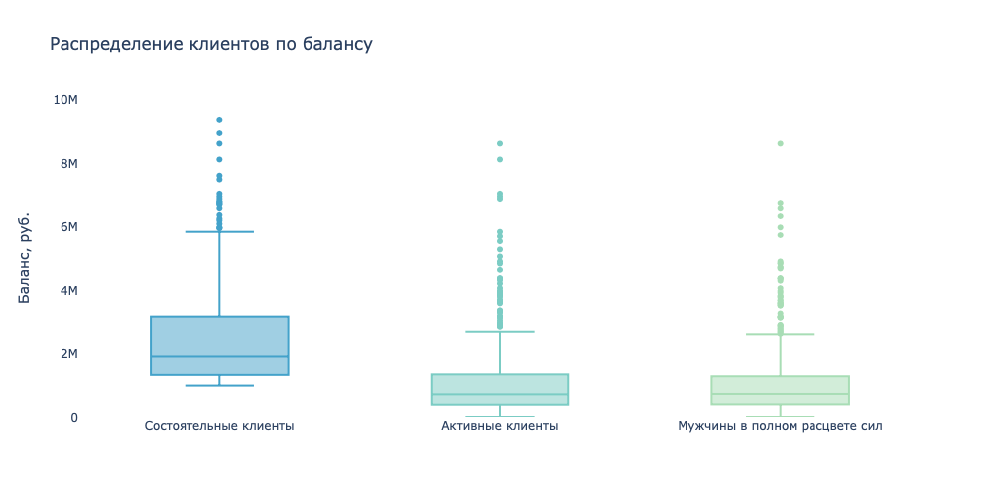

In [61]:
fig = go.Figure()

fig.add_trace(go.Box(
    y=wealthy_clients['balance'],
    marker_color='#43a2ca',
    name='Состоятельные клиенты'
    ))

fig.add_trace(go.Box(
    y=active_clients['balance'],
    marker_color='#7bccc4',
    name='Активные клиенты'
    ))

fig.add_trace(go.Box(
    y=men_full_bloom['balance'],
    marker_color='#a8ddb5',
    name='Мужчины в полном расцвете сил'
    ))

fig.update_layout(title_text='Распределение клиентов по балансу',
                  yaxis_title_text='Баланс, руб.',
                  showlegend=False,
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  yaxis=dict(range=[0, 10000000]),
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

На графике видно, что самый высокий медианный доход у клиентов сегмента "Состоятельные клиенты" (1,89 М), далее - у сегмента "Мужчины в полном расцвете сил" (719,81К), и наконец - у сегмента "Активные клиенты" (707,12К).

Следовательно, приоритезация сегментов следующая:
1. Состоятельные клиенты
2. Мужчины в полном расцвете сил
3. Активные клиенты

### Рекомендации по удержанию

#### Состоятельные клиенты

В качестве механизма удержания состоятельных клиентов мы предлагаем премиальное банковское обслуживание. В него может входить:
- выделение клиенту персонального менеджера
- более высокие ставки по вкладам
- безлимитное посещение бизнес залов в аэропортах и на вокзалах России
- бесплатное страхование для путешествий

#### Мужчины в полном расцвете сил

В качестве механизма удержания клиентов данного сегмента мы предлагаем карту с повышенным кешбеком на такие категории, как рыбалка и охота.

#### Активные клиенты

В качестве механизма удержания активных клиентов мы предлагаем создать информационный канал, в котором команда аналитиков будет публиковать новости финансового рынка, различную аналитику и инвестиционные идеи.

## Общий вывод

Для проведения исследования был использован датафрейм с данными о 10 тысячах клиентов банка. Это достаточно большая база для исследования данных и формирования закономерностей.

В ходе предобработки данных были переименованы столбцы, проанализированы пропуски и дубликаты.

В процессе исследовательского анализа мы изучили распределение различных признаков клиентов агрегировано и в разрезе оттока, рассмотрели корреляцию этих признаков и оттока, а также сформировали портрет отточного клиента.

На основании выводов исследовательского анализа данных мы сформировали и проверили 6 гипотез о признаках отточных клиентов.

После этого мы сформировали, приоритезировали три отточных сегмента и предоставили рекомендации по их удержанию.

## Материалы

Презентацию по результатам исследования можно посмотреть здесь: https://drive.google.com/file/d/1aGqoRWm_B5Lmz4NW1DLw0s9UD1SmJV1u/view?usp=sharing